<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#VGG16" data-toc-modified-id="VGG16-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>VGG16</a></span></li><li><span><a href="#Inception-V3" data-toc-modified-id="Inception-V3-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Inception V3</a></span></li><li><span><a href="#understanding-differnet-layers-in-vgg" data-toc-modified-id="understanding-differnet-layers-in-vgg-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>understanding differnet layers in vgg</a></span></li><li><span><a href="#Model-Activation" data-toc-modified-id="Model-Activation-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Model Activation</a></span></li></ul></div>

# Heat Map in Keras 

https://www.hackevolve.com/where-cnn-is-looking-grad-cam/

In [57]:
import keras 
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from keras.preprocessing import image
from keras.preprocessing.image import array_to_img
import keras.backend as K
import numpy as np
import cv2
from IPython.display import display, Image
import sys
print('keras version:', keras.__version__)

keras version: 2.2.4


## VGG16

https://keras.io/applications/#vgg16

The default input size for this model is 224x224.



In [74]:
model = VGG16(weights="imagenet")
img_path = 'puppy-dog.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

In [3]:
preds = model.predict(x)
class_idx = np.argmax(preds[0])
class_output = model.output[:, class_idx]
last_conv_layer = model.get_layer("block5_conv3")

In [4]:
grads = K.gradients(class_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

chosen_layer_output_shape = last_conv_layer.output_shape[3] 
for i in range(chosen_layer_output_shape):  # was 512 for VGG
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

In [5]:
heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

In [6]:
img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)
# cv2.imshow("Original", img)
# cv2.imshow("GradCam", superimposed_img)
# cv2.waitKey(0)

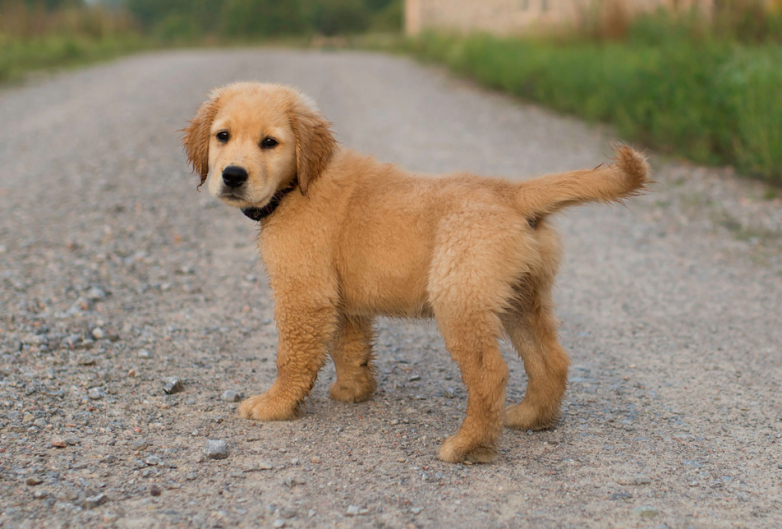

In [12]:
from IPython.display import display, Image
display(Image(filename='puppy-dog.jpg',width=500))

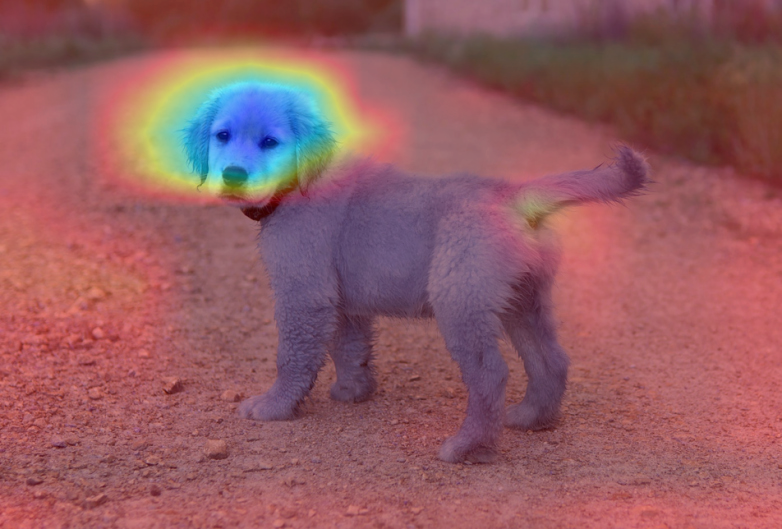

In [23]:
t = array_to_img(superimposed_img)
t.save('heatmap.png')
display(Image(filename='heatmap.png',width=500))

## Inception V3

https://keras.io/applications/#inceptionv3

The default input size for this model is 299x299.



In [46]:
from keras.applications import inception_v3
from keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions

In [38]:
model = InceptionV3(weights="imagenet",classes=1000)

In [15]:
# print names of last 10 layers 
print([i.name for i in model.layers][-20:])

['average_pooling2d_9', 'conv2d_86', 'batch_normalization_88', 'batch_normalization_89', 'batch_normalization_92', 'batch_normalization_93', 'conv2d_94', 'batch_normalization_86', 'activation_88', 'activation_89', 'activation_92', 'activation_93', 'batch_normalization_94', 'activation_86', 'mixed9_1', 'concatenate_2', 'activation_94', 'mixed10', 'avg_pool', 'predictions']


In [54]:
last_conv_layer.output_shape[3]

2048

In [49]:
#img_path = sys.argv[1]
img_path = 'puppy-dog.jpg'
img_path = 'elephant.jpg'
img = image.load_img(img_path, target_size=(299, 299))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = model.predict(x)
class_idx = np.argmax(preds[0])
class_output = model.output[:, class_idx]
last_conv_layer = model.get_layer("mixed10")

grads = K.gradients(class_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

chosen_layer_output_shape = last_conv_layer.output_shape[3] 
for i in range(chosen_layer_output_shape):  # was 512 for VGG
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)


In [52]:
inception_v3.decode_predictions(preds)

[[('n02099601', 'golden_retriever', 0.89279526),
  ('n02099712', 'Labrador_retriever', 0.022935646),
  ('n02093991', 'Irish_terrier', 0.0027685477),
  ('n02113799', 'standard_poodle', 0.002531885),
  ('n02102318', 'cocker_spaniel', 0.0024459674)]]

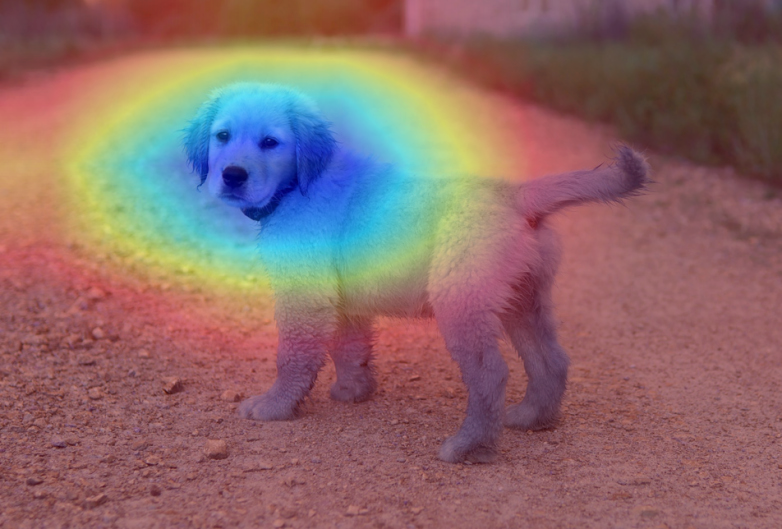

In [50]:
t = array_to_img(superimposed_img)
img_name='heatmap_keras_inceptionv3.png'
t.save(img_name)
display(Image(filename=img_name,width=500))

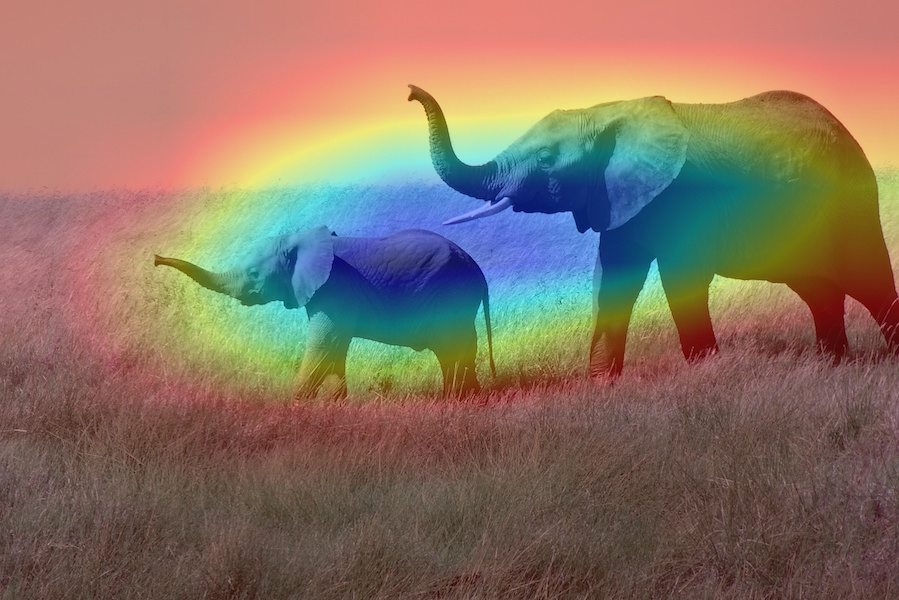

In [48]:
t = array_to_img(superimposed_img)
img_name='heatmap_keras_inceptionv3_elephant.png'
t.save(img_name)
display(Image(filename=img_name,width=500))

## understanding differnet layers in vgg

In [77]:
layer_names = [i.name for i in model.layers if 'conv' in i.name]
print(layer_names)

['block1_conv1', 'block1_conv2', 'block2_conv1', 'block2_conv2', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block5_conv1', 'block5_conv2', 'block5_conv3']


In [82]:
def vgg_heatmap(img_path,layer='block5_conv3'):

#     img_path = 'puppy-dog.jpg'
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    preds = model.predict(x)
    class_idx = np.argmax(preds[0])
    class_output = model.output[:, class_idx]
    last_conv_layer = model.get_layer(layer)

    grads = K.gradients(class_output, last_conv_layer.output)[0]
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

    pooled_grads_value, conv_layer_output_value = iterate([x])

    chosen_layer_output_shape = last_conv_layer.output_shape[3] 
    for i in range(chosen_layer_output_shape):  # was 512 for VGG
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

    heatmap = np.mean(conv_layer_output_value, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    img = cv2.imread(img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    t = array_to_img(superimposed_img)
    saved_img_path='vgg16_layers/vgg16_heatmap_layer_%s.png'% layer
    t.save(saved_img_path)
    display(Image(filename=saved_img_path,width=300))


block1_conv1


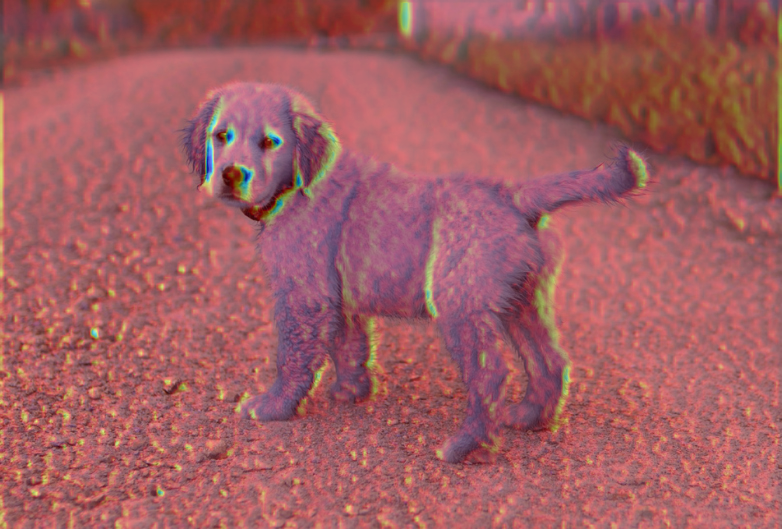

block1_conv2


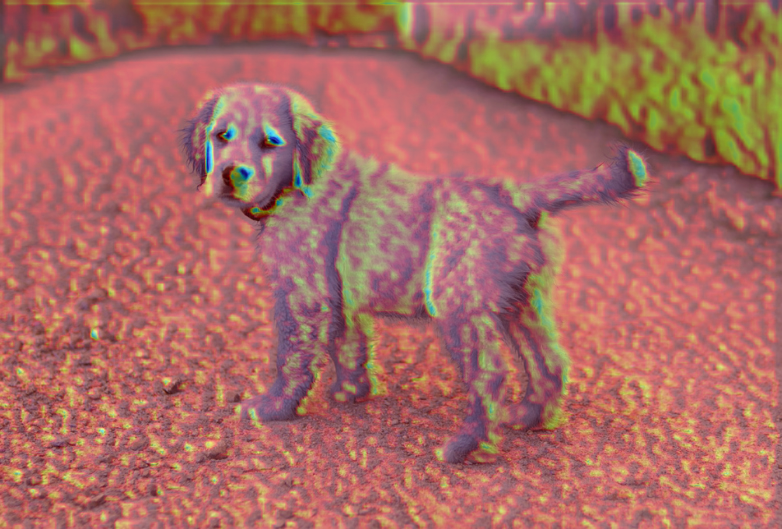

block2_conv1


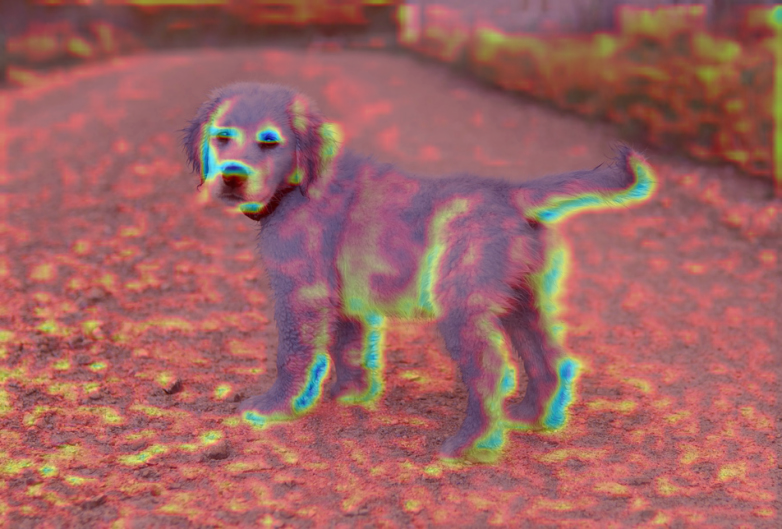

block2_conv2


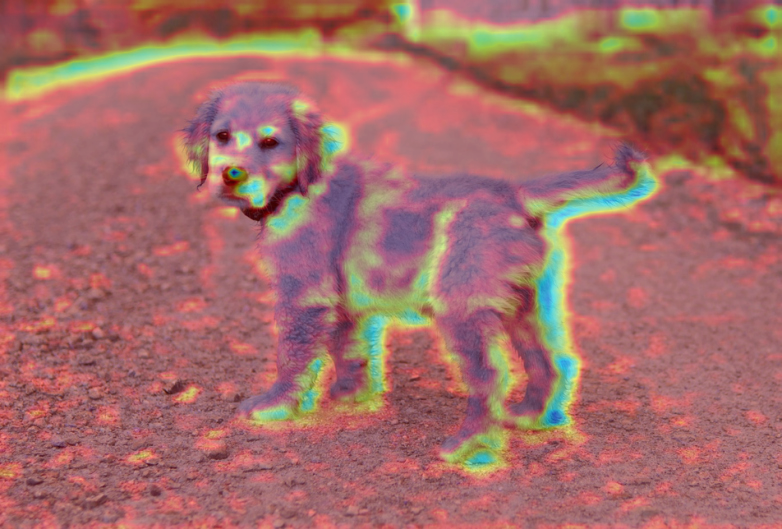

block3_conv1


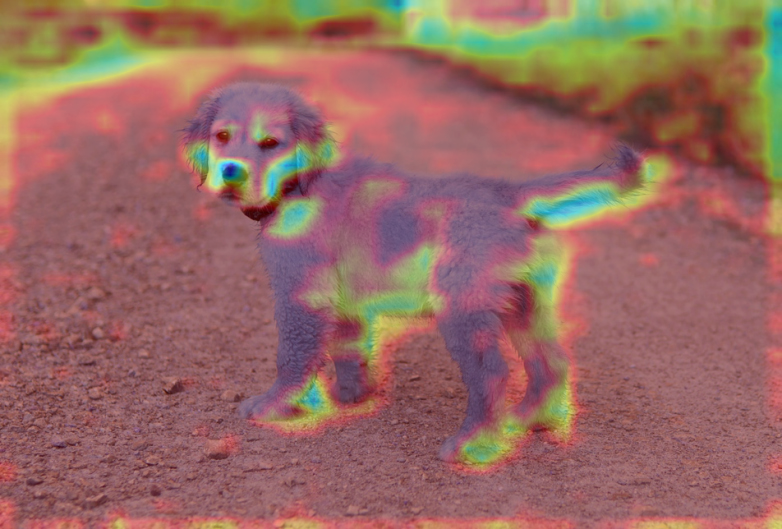

block3_conv2


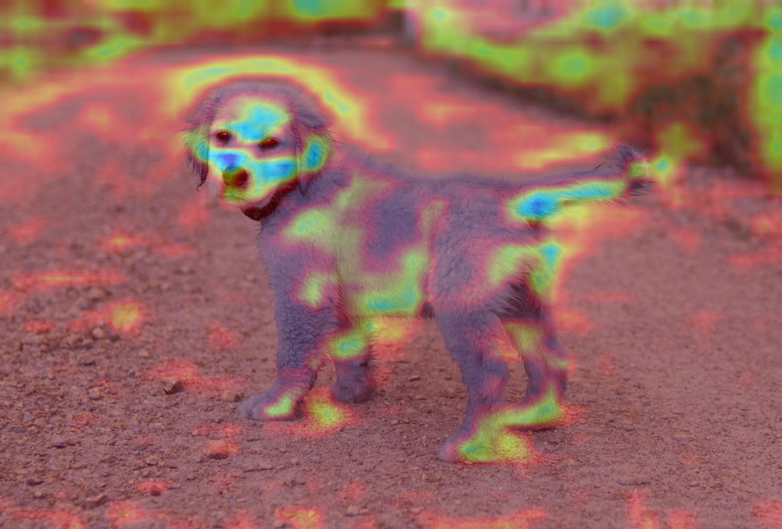

block3_conv3


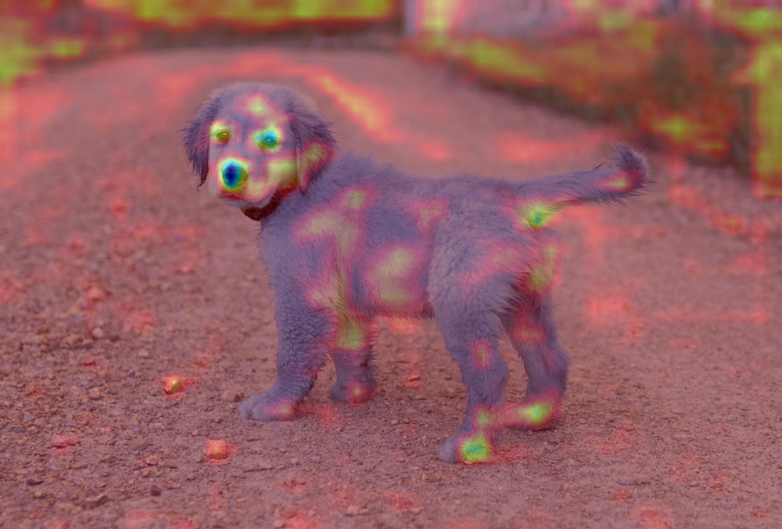

block4_conv1


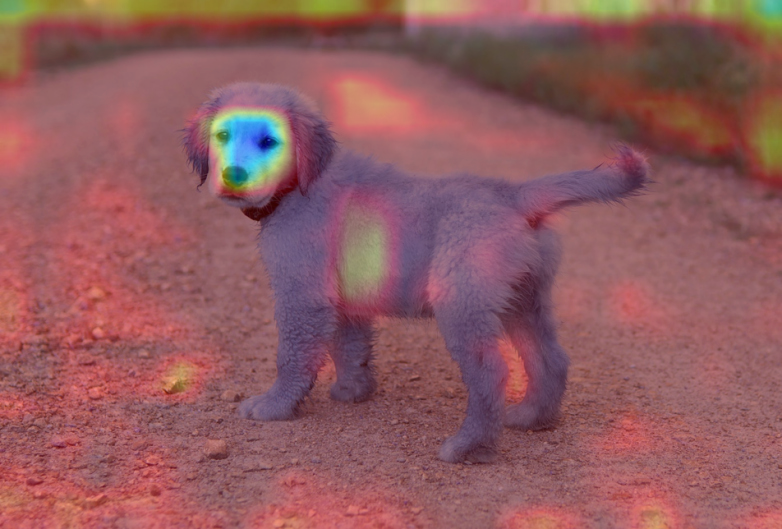

block4_conv2


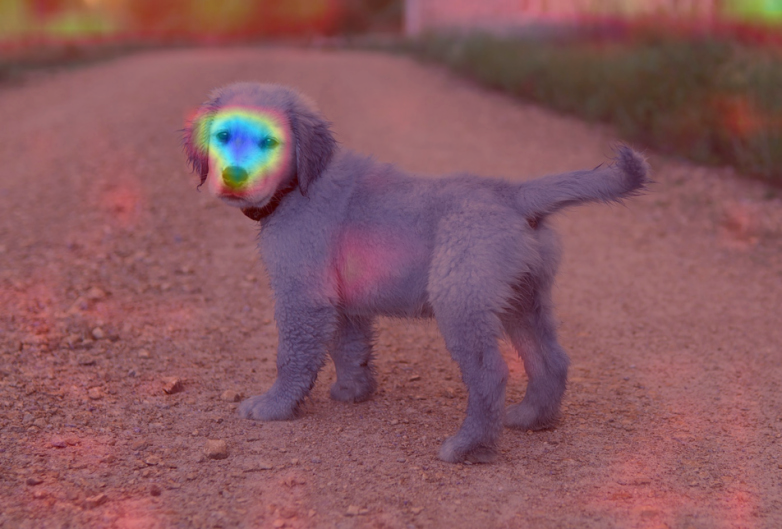

block4_conv3


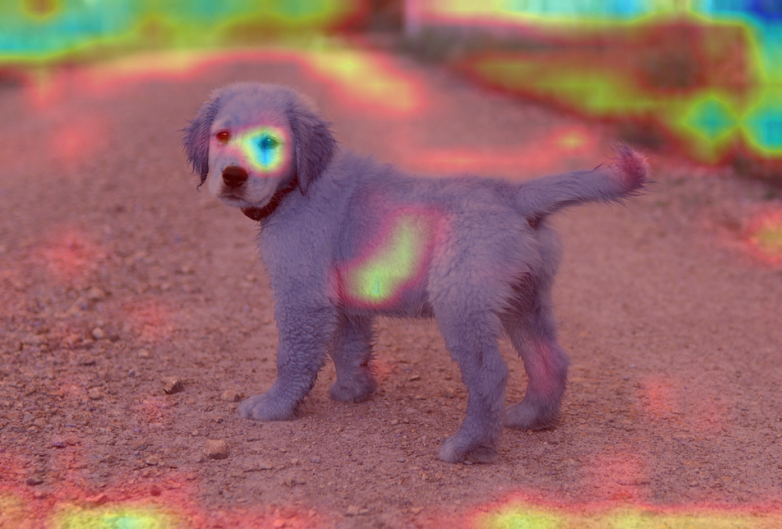

block5_conv1


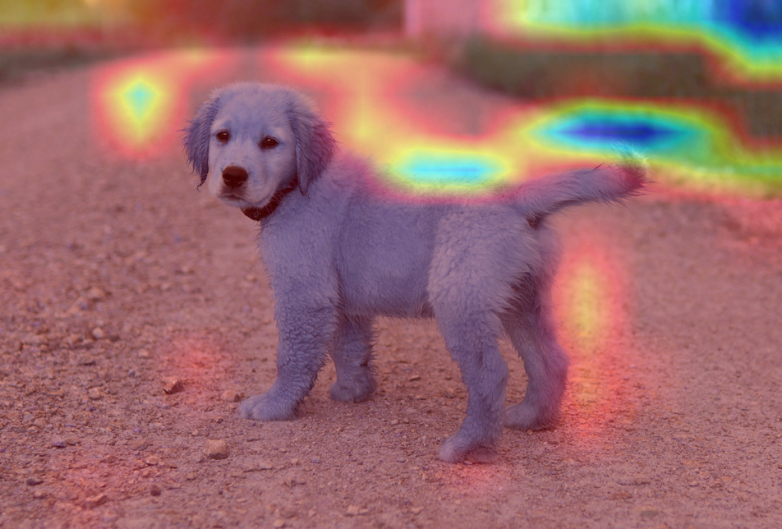

block5_conv2


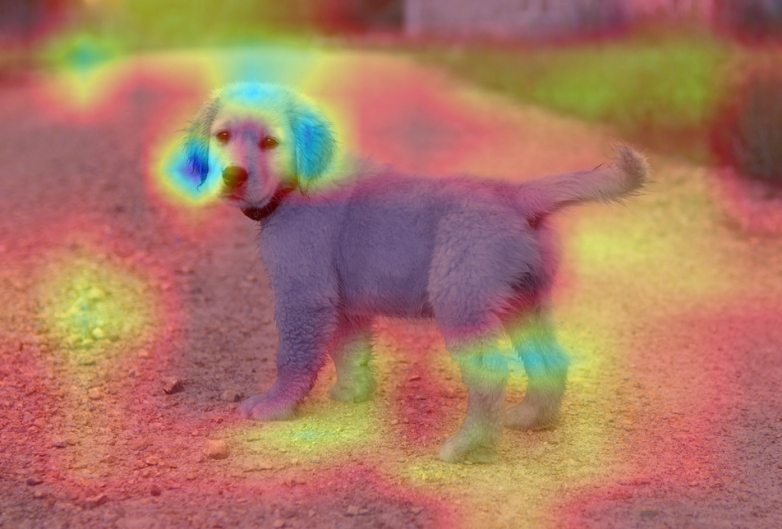

block5_conv3


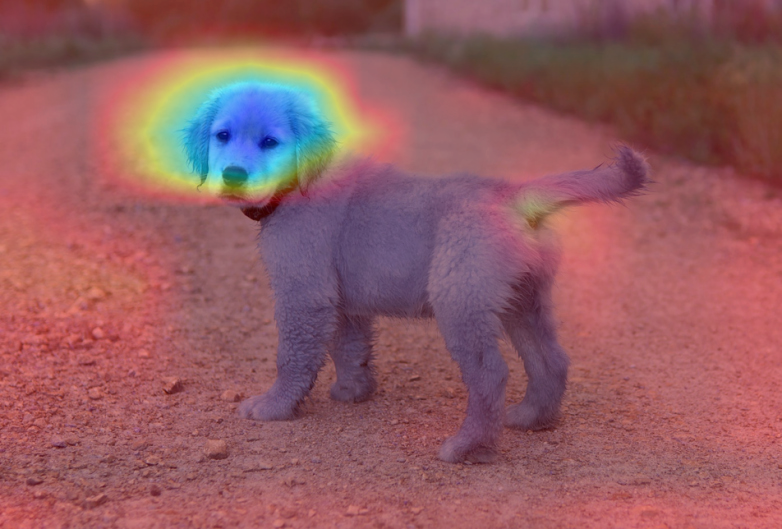

In [83]:
for i in layer_names:
    print(i)
    vgg_heatmap(img_path ='puppy-dog.jpg',layer=i)

## Model Activation